In [1]:
import sys
import librosa
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from librosa import display
from pprint import pprint

sys.path.append("../")
from adaptive_filters.utils import noiseChannel, to_history_matrix
from adaptive_filters.filters import LMSFilter

# Sine Wave (Sanity Check)

In [2]:
N = 5000
n = 10
x = np.sin(np.arange(0, N/10., N/50000.))
xn, _, _ = noiseChannel(x, sigma_n=10)

xn_matrix = to_history_matrix(xn, n)[:-1]
xn, x = xn[n:], x[n:]

print("Original Signal:\n")
pprint(x[:5])
print("\nNoisy Signal:\n")
pprint(xn[:5])
print("\nNoisy History Matrix:\n")
pprint(xn_matrix[:5, :5])

Original Signal:

array([0.84147098, 0.89120736, 0.93203909, 0.96355819, 0.98544973])

Noisy Signal:

array([-0.18973059, -0.57800308,  2.69735487, -1.5693993 , -3.10206727])

Noisy History Matrix:

array([[-2.34960373, -1.92248883,  1.44361665,  0.5699889 , -1.15759873],
       [-1.92248883,  1.44361665,  0.5699889 , -1.15759873,  3.38687627],
       [ 1.44361665,  0.5699889 , -1.15759873,  3.38687627,  4.3504572 ],
       [ 0.5699889 , -1.15759873,  3.38687627,  4.3504572 ,  1.31276238],
       [-1.15759873,  3.38687627,  4.3504572 ,  1.31276238, -0.10645895]])


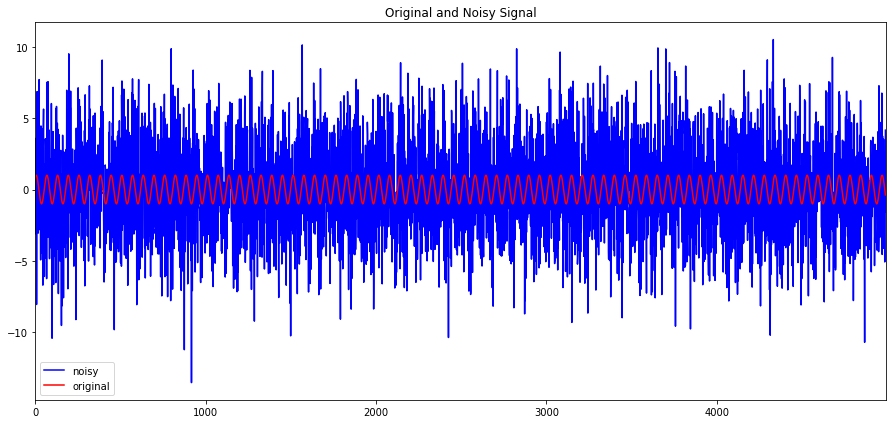

In [3]:
plt.figure(figsize=(12.5,6))
plt.plot(xn, "b", label="noisy")
plt.plot(x, "r", label="original")
plt.title('Original and Noisy Signal')
plt.xlim(0, N-n)
plt.legend()
plt.tight_layout()
plt.show()

In [4]:
mu = 1E-3
init = "random"
sigma = 1.0
lms = LMSFilter(n=n, mu=mu, w=init, sigma=sigma)
y_hat, e, w = lms.fit(xn_matrix, x)

mse_xn = np.mean(np.square(x - xn))
mse_y = np.mean(np.square(x - y_hat))

print("Noisy/Original MSE", mse_xn)
print("Filtered/Original MSE", mse_y)
print("Filter Coefficients\n")
pprint(w)

100%|██████████| 4990/4990 [00:00<00:00, 170962.55it/s]

Fitting Filter
Noisy/Original MSE 9.896419176008585
Filtered/Original MSE 1.2219350782749692
Filter Coefficients

array([0.01553301, 0.02033623, 0.0269665 , 0.03006804, 0.0289966 ,
       0.03051567, 0.03418519, 0.03478202, 0.03020789, 0.0284154 ])


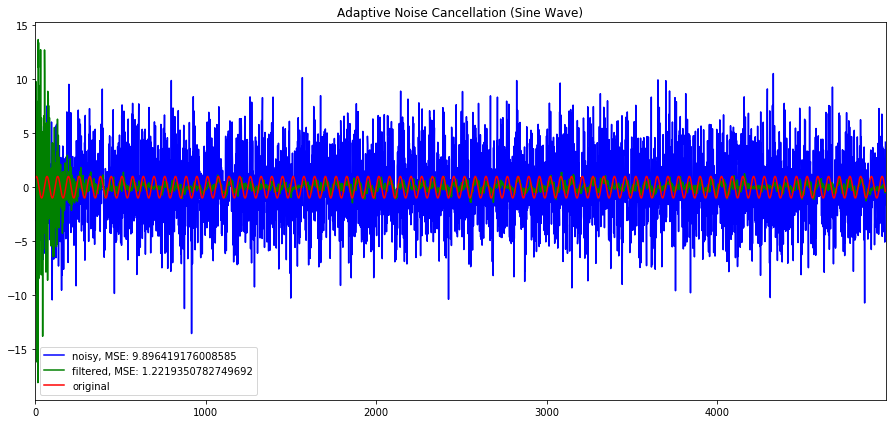

In [5]:
plt.figure(figsize=(12.5,6))
plt.plot(xn, "b", label="noisy, MSE: {}".format(mse_xn))
plt.plot(y_hat, "g", label="filtered, MSE: {}".format(mse_y))
plt.plot(x, "r", label="original")
plt.title('Adaptive Noise Cancellation (Sine Wave)')
plt.xlim(0, N-n)
plt.legend()
plt.tight_layout()
plt.show()

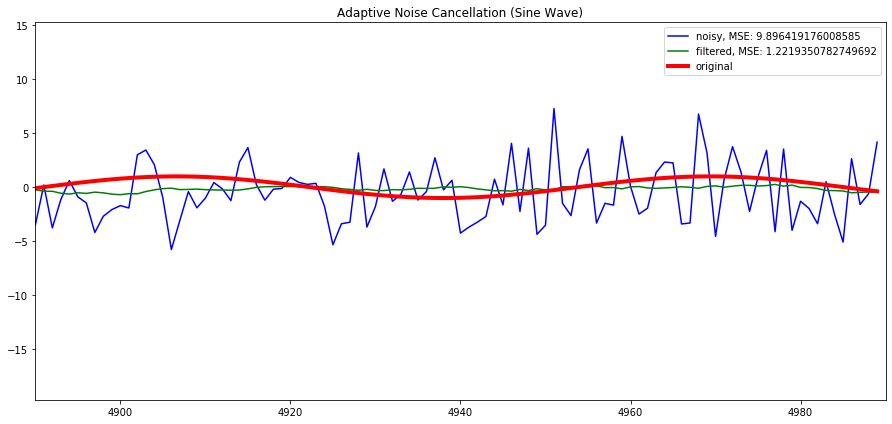

In [6]:
plt.figure(figsize=(12.5,6))
plt.plot(xn, "b", label="noisy, MSE: {}".format(mse_xn))
plt.plot(y_hat, "g", label="filtered, MSE: {}".format(mse_y))
plt.plot(x, "r", linewidth=4, label="original")
plt.title('Adaptive Noise Cancellation (Sine Wave)')
plt.xlim(N-n-100,N-n)
plt.legend()
plt.tight_layout()
plt.show()

# Audio Signal

In [7]:
file_path = "./data/ImperialMarch60.wav"

x, sr = librosa.load(file_path)
print("Signal Shape:", x.shape)
print("Sampling Rate:", sr)

ipd.Audio(x, rate=sr)

Signal Shape: (1323000,)
Sampling Rate: 22050


Text(0.5, 1.0, 'Original Audio Signal Spectrogram')

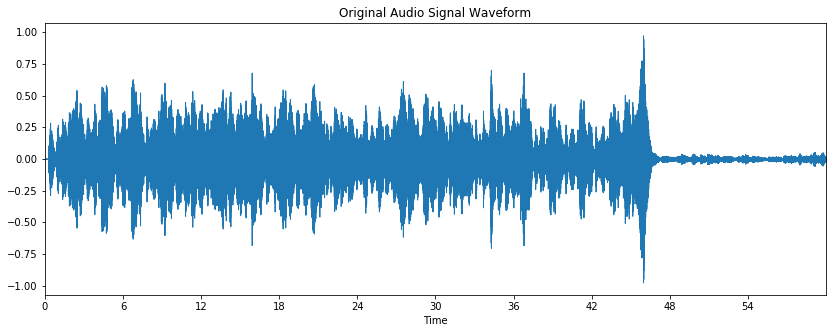

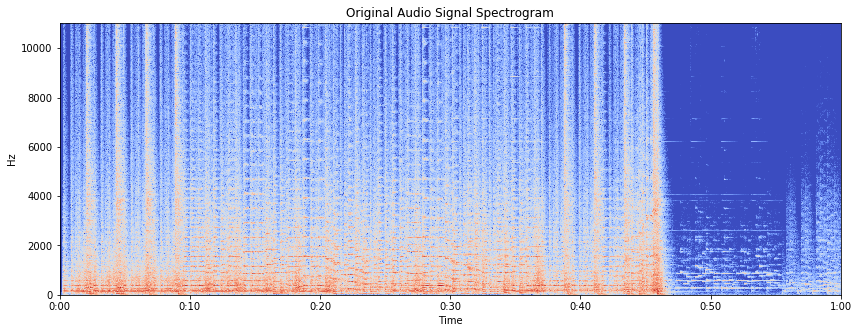

In [8]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)
plt.title("Original Audio Signal Waveform")

X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.title("Original Audio Signal Spectrogram")

In [55]:
N = len(x)
n = 3
sigma_n = 0.1
xn, _, _ = noiseChannel(x, sigma_n=sigma_n)

ipd.Audio(xn, rate=sr)

Text(0.5, 1.0, 'Noisy Audio Signal Spectrogram')

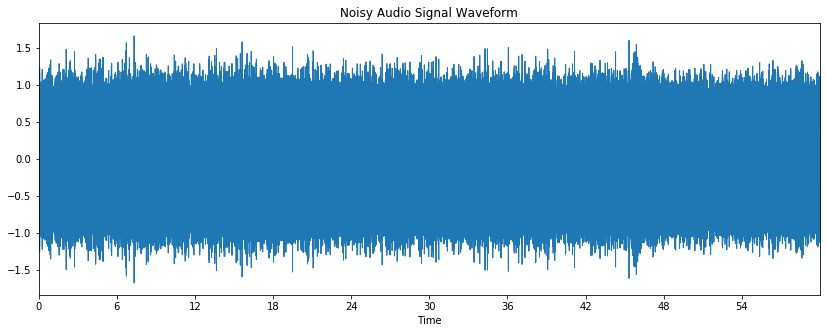

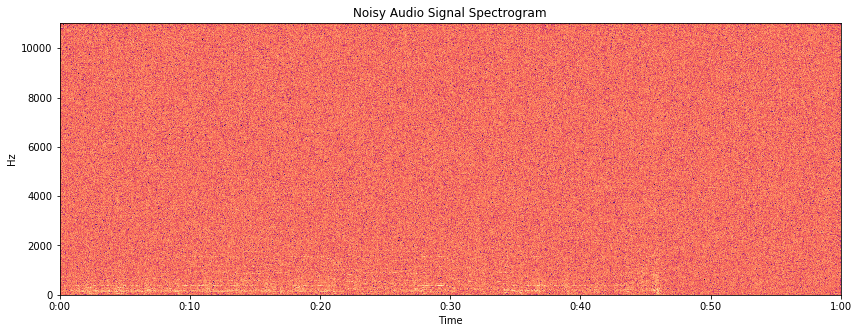

In [56]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(xn, sr=sr)
plt.title("Noisy Audio Signal Waveform")

Xn = librosa.stft(xn)
Xndb = librosa.amplitude_to_db(abs(Xn))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xndb, sr=sr, x_axis='time', y_axis='hz')
plt.title("Noisy Audio Signal Spectrogram")

In [57]:
xn_matrix = to_history_matrix(xn, n)[:-1]
xn, x = xn[n:], x[n:]

print("Original Signal:\n")
pprint(x[:5])
print("\nNoisy Signal:\n")
pprint(xn[:5])
print("\nNoisy History Matrix:\n")
pprint(xn_matrix[:5, :5])

Original Signal:

array([0.00015259, 0.00027466, 0.00030518, 0.00039673, 0.00030518],
      dtype=float32)

Noisy Signal:

array([ 0.02759946, -0.15442705,  0.29105025,  0.3789782 ,  0.06715965])

Noisy History Matrix:

array([[-0.23474675, -0.20204912,  0.12489146],
       [-0.20204912,  0.12489146,  0.02759946],
       [ 0.12489146,  0.02759946, -0.15442705],
       [ 0.02759946, -0.15442705,  0.29105025],
       [-0.15442705,  0.29105025,  0.3789782 ]])


In [58]:
mu = 0.5
init = "random"
sigma = 1.0
lms = LMSFilter(n=n, mu=mu, w=init, sigma=sigma)
y_hat, e, w = lms.fit(xn_matrix, x)

mse_xn = np.mean(np.square(x - xn))
mse_y = np.mean(np.square(x - y_hat))

print("Noisy/Original MSE", mse_xn)
print("Filtered/Original MSE", mse_y)
print("Filter Coefficients\n")
pprint(w)

  2%|▏         | 25674/1322659 [00:00<00:10, 118467.03it/s]

Fitting Filter


100%|██████████| 1322659/1322659 [00:09<00:00, 143964.04it/s]

Noisy/Original MSE 0.09988814980258061
Filtered/Original MSE 0.006562189367739555
Filter Coefficients

array([0.0017831 , 0.00172899, 0.00136807])


Text(0.5, 1.0, 'Filtered Audio Signal Spectrogram')

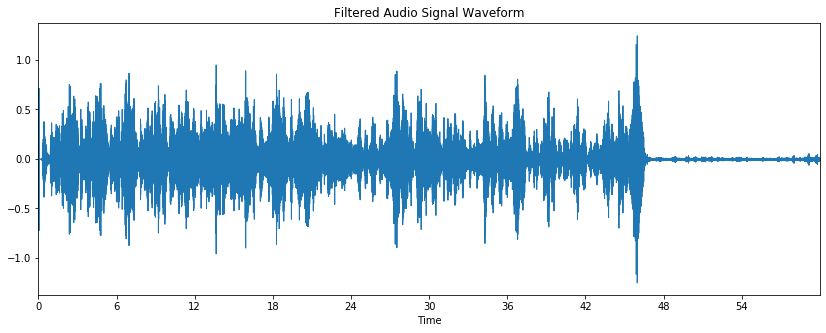

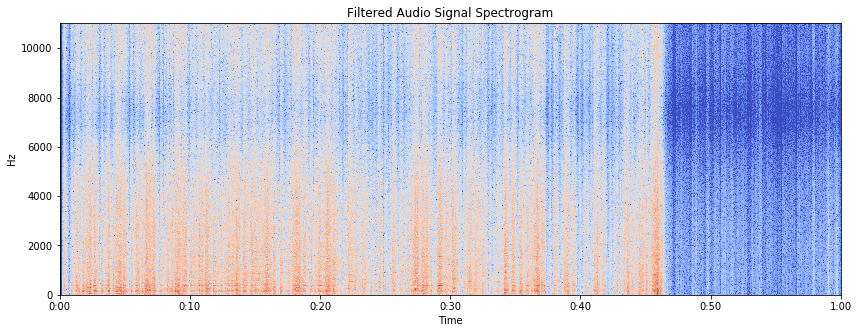

In [59]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(y_hat, sr=sr)
plt.title("Filtered Audio Signal Waveform")

Y = librosa.stft(y_hat)
Ydb = librosa.amplitude_to_db(abs(Y))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Ydb, sr=sr, x_axis='time', y_axis='hz')
plt.title("Filtered Audio Signal Spectrogram")

In [60]:
ipd.Audio(y_hat, rate=sr)

/Users/icorley/miniconda3/envs/dspenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  import sys
/Users/icorley/miniconda3/envs/dspenv/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


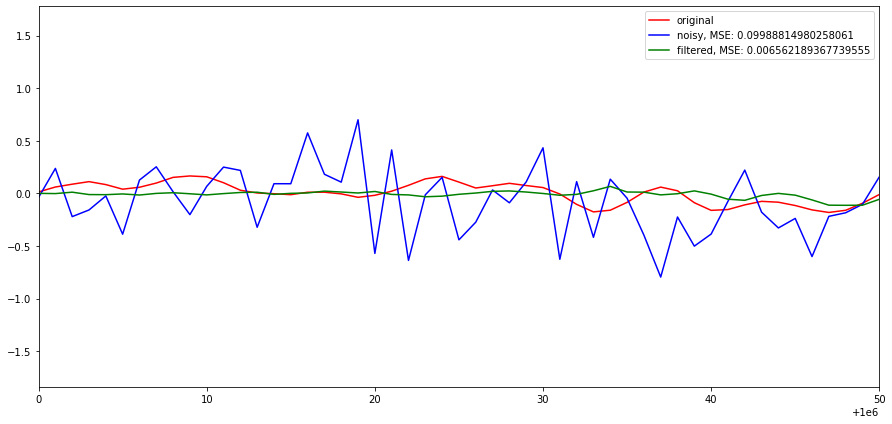

In [61]:
plt.figure(figsize=(12.5,6))
plt.plot(x, "r", label="original")
plt.plot(xn, "b", label="noisy, MSE: {}".format(mse_xn))
plt.plot(y_hat, "g", label="filtered, MSE: {}".format(mse_y))
plt.xlim(1000000, 1000050)
plt.legend()
plt.tight_layout()
plt.show()